The goal of this blog post is to implement the [DiffEdit paper](https://arxiv.org/abs/2210.11427) to the best of my understanding. While this task is primarily to help my own understanding of the process, I also want to help the reader of my post understand the process better as well.

Before I start, I want to give a big thanks to the DiffEdit authors (Guillaume Couairon, Jakob Verbeek, Holger Schwenk, and Matthieu Cord) for publishing this paper.  Without the openness and willingness to share, this type of implementation would not be possible. I also want to thank the fast.ai community for helping me solve problems when I was unclear about how to move forward. Finally, I want to thank Jonathan Whitaker, the auther of [the Stable Diffusion Deep Dive notebook](https://github.com/fastai/diffusion-nbs/blob/master/Stable%20Diffusion%20Deep%20Dive.ipynb). This was the notebook that I started with in my DiffEdit implementation.

If anybody reading this blog post works in manufacturing and cares about improving product quality (or knows somebody that does), please reach out to me at kevin@problemsolversguild.com.

In [1]:
#| include: false
# Run the following pip to start in colab
# !pip install -q --upgrade transformers diffusers ftfy pillow

In [3]:
#| include: false
# Importing the libraries
import torch
import torch.nn.functional as F
from transformers import CLIPTextModel, CLIPTokenizer
from transformers import logging
from diffusers import AutoencoderKL, UNet2DConditionModel, LMSDiscreteScheduler, DDIMScheduler
from diffusers import StableDiffusionInpaintPipeline

# from diffusers import StableDiffusionImg2ImgPipeline
from PIL import Image
from matplotlib import pyplot as plt
from pathlib import Path
from fastdownload import FastDownload
import PIL
import cv2
import numpy as np

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

from huggingface_hub import notebook_login
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

Login successful
Your token has been saved to /home/dev/.huggingface/token
Authenticated through git-credential store but this isn't the helper defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub. Run the following command in your terminal in case you want to set this credential helper as the default

git config --global credential.helper store


#hide
## Loading the models

This code (and that in the next section) comes from the [Huggingface example notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb). 

This will download and set up the relevant models and components we'll be using. Let's just run this for now and move on to the next section to check that it all works before diving deeper.

If you've loaded a pipeline, you can also access these components using `pipe.unet`, `pipe.vae` and so on.

In [ ]:
#| include: false runwayml/stable-diffusion-inpainting
# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

In [46]:
# The noise scheduler
# scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)
scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)

In [47]:
scheduler.timesteps

tensor([999, 998, 997, 996, 995, 994, 993, 992, 991, 990, 989, 988, 987, 986,
        985, 984, 983, 982, 981, 980, 979, 978, 977, 976, 975, 974, 973, 972,
        971, 970, 969, 968, 967, 966, 965, 964, 963, 962, 961, 960, 959, 958,
        957, 956, 955, 954, 953, 952, 951, 950, 949, 948, 947, 946, 945, 944,
        943, 942, 941, 940, 939, 938, 937, 936, 935, 934, 933, 932, 931, 930,
        929, 928, 927, 926, 925, 924, 923, 922, 921, 920, 919, 918, 917, 916,
        915, 914, 913, 912, 911, 910, 909, 908, 907, 906, 905, 904, 903, 902,
        901, 900, 899, 898, 897, 896, 895, 894, 893, 892, 891, 890, 889, 888,
        887, 886, 885, 884, 883, 882, 881, 880, 879, 878, 877, 876, 875, 874,
        873, 872, 871, 870, 869, 868, 867, 866, 865, 864, 863, 862, 861, 860,
        859, 858, 857, 856, 855, 854, 853, 852, 851, 850, 849, 848, 847, 846,
        845, 844, 843, 842, 841, 840, 839, 838, 837, 836, 835, 834, 833, 832,
        831, 830, 829, 828, 827, 826, 825, 824, 823, 822, 821, 8

In [6]:
#| include: false
# To the GPU we go!
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device);

The first thing we need to do is choose an image that we want to use as a starting point. I chose to go with a picture that was similar to one of the images used in the paper, but maybe a little harder. 

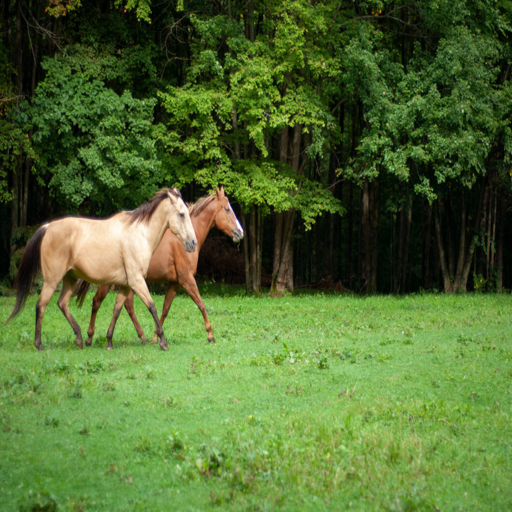

In [7]:
p = FastDownload().download('https://negativespace.co/wp-content/uploads/2020/11/negative-space-horses-in-field-with-trees-1062x705.jpg')
init_image = Image.open(p).convert("RGB")
# init_image = init_image.resize((init_image.size[0]//2, init_image.size[1]//2))
init_image = init_image.resize((512,512))
init_image

Now that I have found an image, let's define the `reference_text` and the `query_text`.  These are defined in the paper as `R`  and `Q`. Let's follow the paper here and keep Q and R simple.  

In [8]:
reference_text = "Two horses"
query_text = "Two zebras"

A good amount of the code in the next few cells is coming from the StableDiffusionImg2ImgPipeline function in the diffusers library. This was very helpful in creating the implementation I ended up with

In [9]:
def preprocess(image):
    w, h = image.size
    w, h = map(lambda x: x - x % 32, (w, h))  # resize to integer multiple of 32
    image = image.resize((w, h), resample=PIL.Image.Resampling.LANCZOS)
    image = np.array(image).astype(np.float32) / 255.0
    image = image[None].transpose(0, 3, 1, 2)
    image = torch.from_numpy(image)
    return 2.0 * image - 1.0

In [10]:
def get_text_embeddings(prompt, negative_prompt, tokenizer, text_encoder, do_classifier_free_guidance, device): #outputs text_embeddings
    # get prompt text embeddings
    text_inputs = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, 
                            return_tensors="pt", truncation=True)
    text_input_ids = text_inputs.input_ids
    text_embeddings = text_encoder(text_input_ids.to(device))[0]
    # text_embeddings = text_embeddings.repeat_interleave(num_images_per_prompt, dim=0)
    
    if negative_prompt is None:
        uncond_tokens = [""]
    else:
        uncond_tokens = negative_prompt
    max_length = text_input_ids.shape[-1]
    uncond_input = tokenizer(uncond_tokens, padding="max_length", max_length=max_length, 
                             return_tensors="pt", truncation=True)
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]

    # duplicate unconditional embeddings for each generation per prompt
    # uncond_embeddings = uncond_embeddings.repeat_interleave(batch_size * num_images_per_prompt, dim=0)
    
    # For classifier free guidance, we need to do two forward passes.
    # Here we concatenate the unconditional and text embeddings into a single batch
    # to avoid doing two forward passes
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])
    return text_embeddings

In [11]:
def get_timestamps(scheduler, num_inference_steps, strength, device):
    scheduler.set_timesteps(num_inference_steps)

    # get the original timestep using init_timestep
    offset = scheduler.config.get("steps_offset", 0)
    init_timestep = int(num_inference_steps * strength) + offset
    init_timestep = min(init_timestep, num_inference_steps)

    timesteps = scheduler.timesteps[-init_timestep]
    timesteps = torch.tensor([timesteps], device=device)
    t_start = max(num_inference_steps - init_timestep + offset, 0)
    return timesteps, t_start

In [12]:
def encode_image(init_image, latents_dtype, device):
    # encode the init image into latents and scale the latents
    init_image = preprocess(init_image)
    init_image = init_image.to(device=device, dtype=latents_dtype)
    with torch.no_grad(): init_latent_dist = vae.encode(init_image).latent_dist
    init_latents = init_latent_dist.sample(generator=generator)
    init_latents = 0.18215 * init_latents
    return init_latents

In [44]:
def img2noise(init_image, 
              prompt,
              mask=None,
              strength = 0.5,
              num_inference_steps = 50,
              guidance_scale = 5,
              negative_prompt=None,
              generator = None, 
              output_type = "pil", 
              return_dict = True, 
              callback = None, 
              callback_steps = 1, 
              device='cuda'
             ):
    do_classifier_free_guidance = guidance_scale > 1.0
    text_embeddings = get_text_embeddings(prompt, negative_prompt, tokenizer, text_encoder, do_classifier_free_guidance, device)
    latents_dtype=text_embeddings.dtype
    timesteps, t_start = get_timestamps(scheduler, num_inference_steps, strength, device)
    
    # encode the init image into latents and scale the latents
    init_latents = encode_image(init_image, latents_dtype, device)

    # add noise to latents using the timesteps
    noise = torch.randn(init_latents.shape, generator=generator, device=device, dtype=latents_dtype)
    noisy_latents = scheduler.add_noise(init_latents, noise, timesteps)

    latents = noisy_latents

    # Some schedulers like PNDM have timesteps as arrays
    # It's more optimized to move all timesteps to correct device beforehand
    timesteps = scheduler.timesteps[t_start:].to(device)
    noise_preds = torch.tensor([], device='cuda')
    print(timesteps)
    for i, t in enumerate(timesteps):
        # expand the latents if we are doing classifier free guidance
        latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        if do_classifier_free_guidance:
            noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
            noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
        
        noise_preds = torch.concat((noise_preds, noise_pred)) #This performs much worse when outside the for-loop
        # compute the previous noisy sample x_t -> x_t-1
        latent_step = scheduler.step(noise_pred, t, latents)
        latents = latent_step.prev_sample 
        if mask is not None: 
            latents = mask*latents+(1-mask)*init_latents
            
    latents = 1 / 0.18215 * latents
    with torch.no_grad(): image = vae.decode(latents).sample

    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images, noise_preds

![](notebook_images/2022-11-02-DiffEdit-Implementation/diffedit_step1.png)

### Estimate noise conditioned to Reference Text R

In [45]:
generator = torch.cuda.manual_seed(32)
reference_noises = torch.tensor([], device='cuda')
for _ in range(10):
    reference_pil, reference_noise = img2noise(init_image, strength=0.5, prompt=reference_text, generator=generator)
    reference_noises = torch.concat((reference_noises, reference_noise))

tensor([489.3061, 468.9184, 448.5306, 428.1429, 407.7551, 387.3673, 366.9796,
        346.5918, 326.2041, 305.8163, 285.4286, 265.0408, 244.6531, 224.2653,
        203.8776, 183.4898, 163.1020, 142.7143, 122.3265, 101.9388,  81.5510,
         61.1633,  40.7755,  20.3878,   0.0000], device='cuda:0',
       dtype=torch.float64)
tensor([489.3061, 468.9184, 448.5306, 428.1429, 407.7551, 387.3673, 366.9796,
        346.5918, 326.2041, 305.8163, 285.4286, 265.0408, 244.6531, 224.2653,
        203.8776, 183.4898, 163.1020, 142.7143, 122.3265, 101.9388,  81.5510,
         61.1633,  40.7755,  20.3878,   0.0000], device='cuda:0',
       dtype=torch.float64)
tensor([489.3061, 468.9184, 448.5306, 428.1429, 407.7551, 387.3673, 366.9796,
        346.5918, 326.2041, 305.8163, 285.4286, 265.0408, 244.6531, 224.2653,
        203.8776, 183.4898, 163.1020, 142.7143, 122.3265, 101.9388,  81.5510,
         61.1633,  40.7755,  20.3878,   0.0000], device='cuda:0',
       dtype=torch.float64)
tensor([489.3061

In [42]:
scheduler.step??

### Estimate noise conditioned to Query Q

In [15]:
generator = torch.cuda.manual_seed(32)
query_noises = torch.tensor([], device='cuda')
for _ in range(10):
    query_pil, query_noise = img2noise(init_image, strength=0.5, prompt=query_text, generator=generator)
    query_noises = torch.concat((query_noises, query_noise))

### View Latent Noise Channels

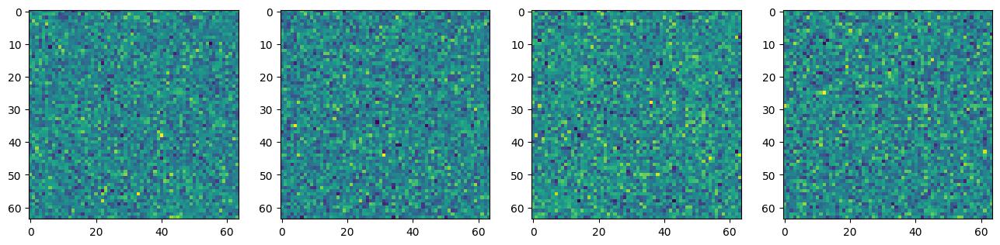

In [16]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(reference_noises.mean(0, keepdim=True)[0][c].cpu())

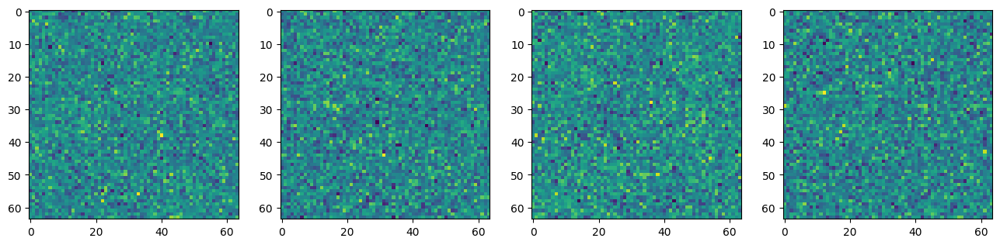

In [17]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(query_noises.mean(0, keepdim=True)[0][c].cpu())

While there isn't much that looks interesting when looking at the `reference_noises` or `query_noises` individually, let's look at the difference between the two. 

In [18]:
diff_noises = (reference_noises.mean(0, keepdim=True) - query_noises.mean(0, keepdim=True))

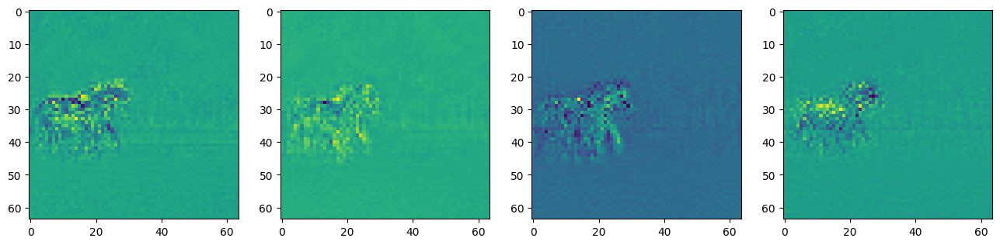

In [19]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(diff_noises[0][c].cpu())

Now, we are seeing some signs that the noise that is being removed is quite different over the horse area of the picture and pretty similar outside of that area. One thing to note on these channels is that some of them are darker surrounding the horses and some are lighter. 

In [20]:
diff_noises.min(), diff_noises.max()

(tensor(-0.8503, device='cuda:0'), tensor(0.6133, device='cuda:0'))

One thing I've found improves this is to determine the distance away from the midpoint, so I take the absolute value to make sure the intensity, not the direction, is being taken into consideration.  The thought here is that whether the zebra query or the horse reference is activating that noise a lot, it is probably a pixel we should include in the mask. 

In [21]:
diff_noises_abs = diff_noises.abs()

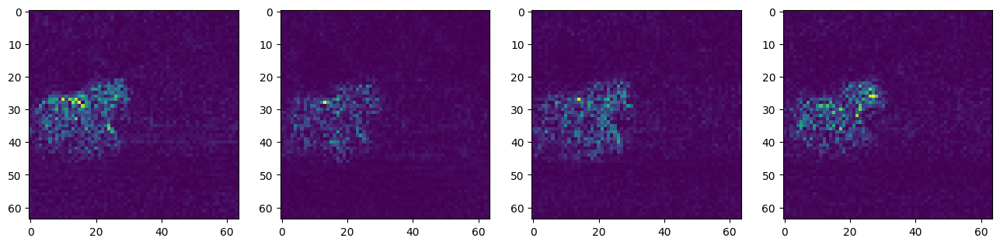

In [22]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(diff_noises_abs[0][c].cpu())#, cmap='Greys')

Now, let's scale all of our values to be between 0 and 1 by subtracting the smallest value and then dividing everything by the largest value. I am not removing any values when doing this although I will note here that the paper does say to "remove extreme values in noise predictions".  I wasn't sure how to go about doing this. 

In [23]:
diff_noise_normed = (diff_noises_abs - diff_noises_abs.min())/(diff_noises_abs - diff_noises_abs.min()).max()

In [24]:
diff_noise_normed.min(), diff_noise_normed.max()

(tensor(0., device='cuda:0'), tensor(1., device='cuda:0'))

In [25]:
#| include: false
# pre_mask = (diff_noise_normed-0.5).abs()+0.5

In [26]:
mask = diff_noise_normed.mean(dim=1).squeeze()

In [27]:
#| include: false
# plt.imshow(pre_mask[0][0].cpu())

In [28]:
#| include: false
# plt.imshow(pre_mask[0][1].cpu())

In [29]:
#| include: false
# plt.imshow(pre_mask[0][2].cpu())

In [30]:
#| include: false
# plt.imshow(pre_mask[0][3].cpu())

The next step is to binarize the mask so that everything is either a 0 or a 1. To acheive this, I used Otsu thresholding which I believe deviates from the version that is used in the paper which seems more straightforward: "binarized with a threshold, which we set to 0.5 by default". I was never able to get a mask that I was happy with when using that strategy.  

In [31]:
def extract_channel_mask(img, do_inverse=False):
    kernel = np.ones((3,3),np.uint8)
    img = (img*255).squeeze().cpu().to(torch.uint8).numpy()
    if do_inverse:
        ret2,img2 = cv2.threshold(img,0,1,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    else:
        ret2,img2 = cv2.threshold(img,0,1,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    dilate = cv2.dilate(img2, kernel)
    return dilate

In [32]:
final_mask = extract_channel_mask(mask)

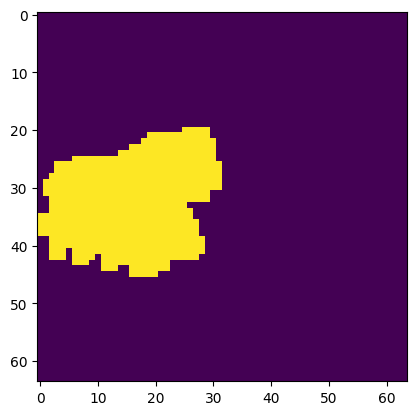

In [33]:
plt.imshow(final_mask)

Since our mask is generated in Latent Space, we have to find a way to go from latent space back to the original image space.  For this, I decided to use F.interpolate.

In [34]:
horse_sized_mask = F.interpolate(torch.from_numpy(final_mask).unsqueeze(0).unsqueeze(0), mode='nearest', size=(init_image.size[1],init_image.size[0])).squeeze()

The mask came out looking pretty good for this easy prompt. The horses are definitely well masked and seem to match what would intuitively make sense. I have done some other prompts that didn't look good including trying to change the grass into sand  and changing the forest into a mushroom forest.  Both of these included the horses in the mask still. 

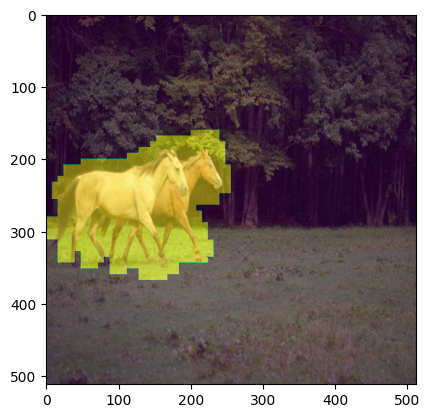

In [35]:
plt.imshow(init_image)
plt.imshow(horse_sized_mask.squeeze().cpu(), alpha=0.5)

Most of the interesting results from this paper are coming from step 1.  The other two steps are hard to really build up to, but I will share them here.  

Step 2: Encoding is replicating the step that was done before where we add noise back into the latent. This is already being done so there was no new code that was needed to accomplish this. This is the code where that step occurs:  
```
    # add noise to latents using the timesteps
    noise = torch.randn(init_latents.shape, generator=generator, device=device, dtype=latents_dtype)
    noisy_latents = scheduler.add_noise(init_latents, noise, timesteps)
```

Step 3: Decode with mask-wise correction is interesting, but also a step that doesn't add much code.  The idea of step 3 is that anything outside of the mask that was generated from step 1 will be reverted to the original pixel value. So only the pixels that are inside of the masked areas will be changed which helps accomplish the goal of keeping most of the original image the same as before the prompt.  

Here is the equation of the concept I described: 
$\tilde{y}_t = M*y_t + (1−M)*x_t$ where $y_t$ is the new image and $x_t$ is the original image (both encoded in latent space).  

Let's look at the results:

In [36]:
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    revision="fp16",
    torch_dtype=torch.float16,
).to(torch_device)

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

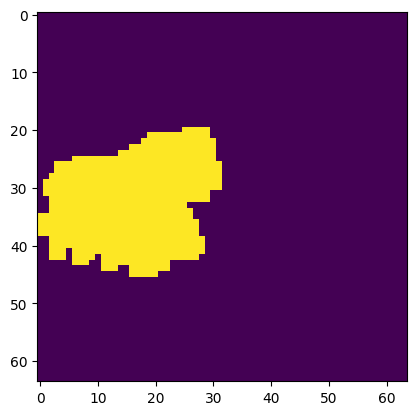

In [37]:
plt.imshow(torch.from_numpy((final_mask)).cuda().float().cpu())

In [38]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = PIL.Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

0


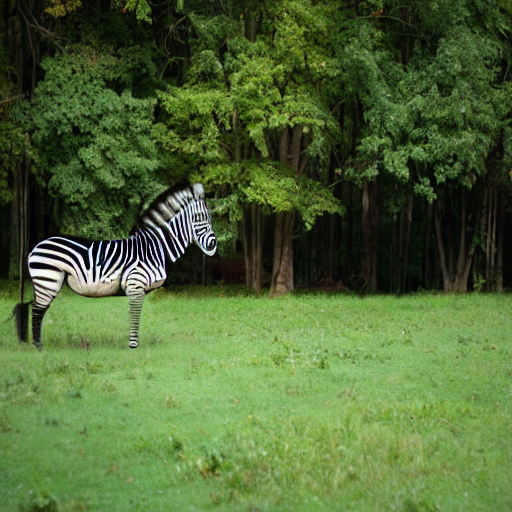

  0%|          | 0/50 [00:00<?, ?it/s]

1


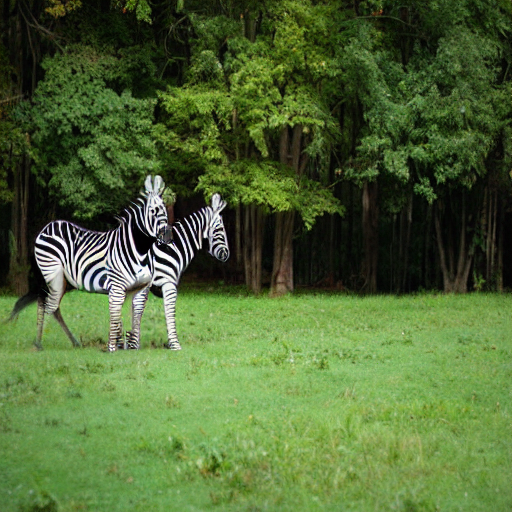

  0%|          | 0/50 [00:00<?, ?it/s]

2


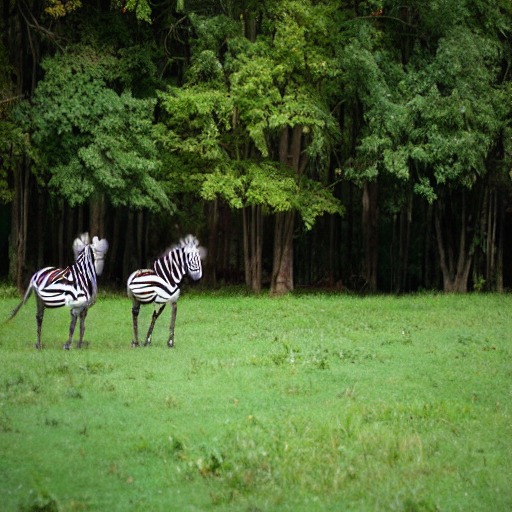

  0%|          | 0/50 [00:00<?, ?it/s]

3


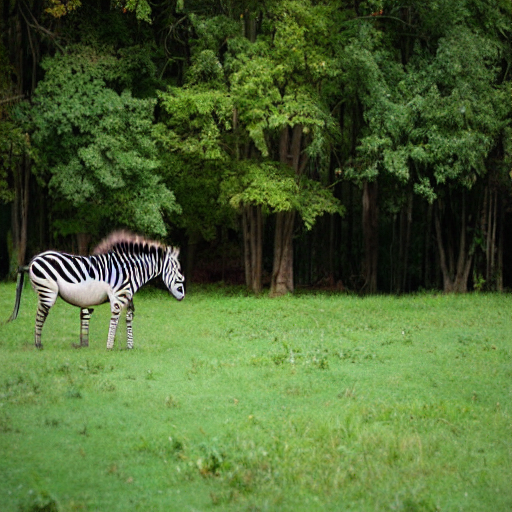

  0%|          | 0/50 [00:00<?, ?it/s]

4


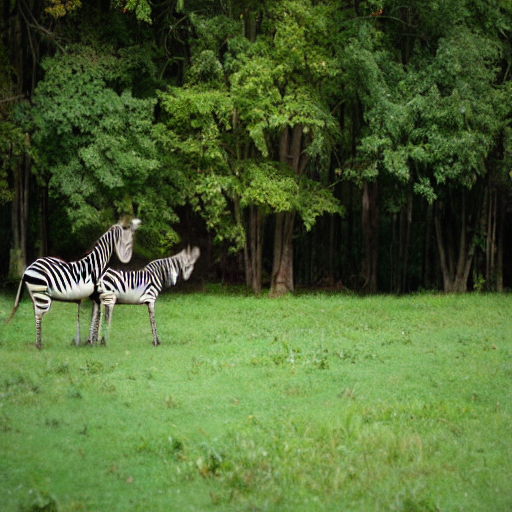

  0%|          | 0/50 [00:00<?, ?it/s]

5


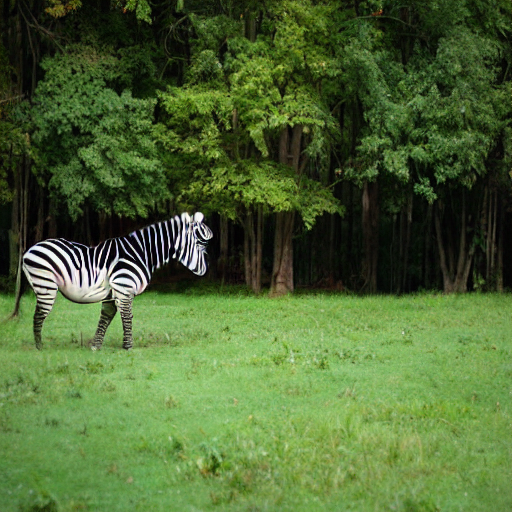

  0%|          | 0/50 [00:00<?, ?it/s]

6


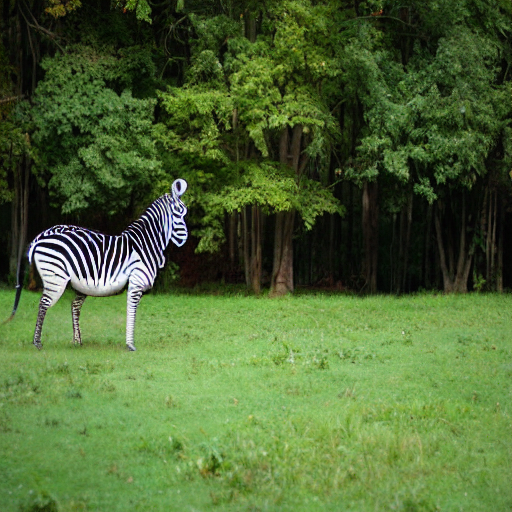

  0%|          | 0/50 [00:00<?, ?it/s]

7


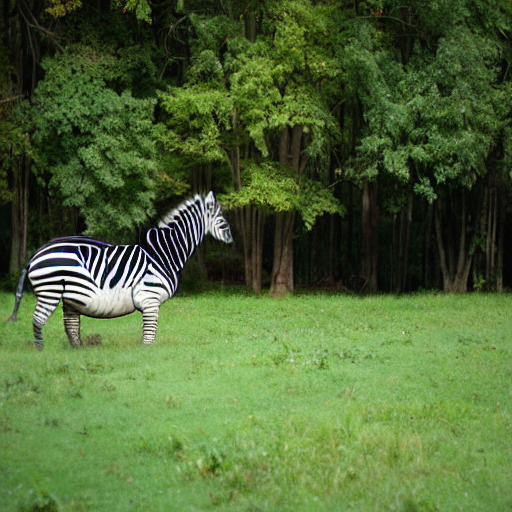

  0%|          | 0/50 [00:00<?, ?it/s]

8


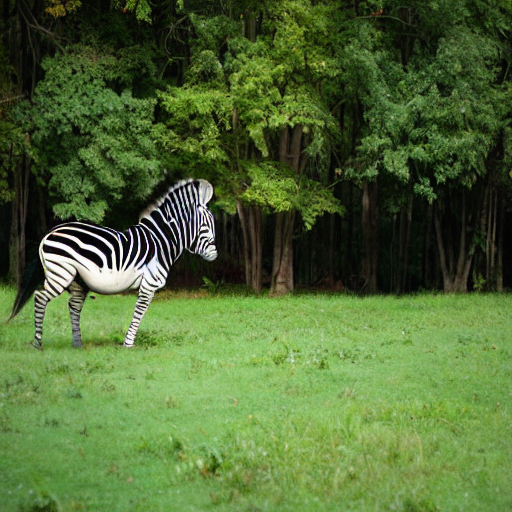

  0%|          | 0/50 [00:00<?, ?it/s]

9


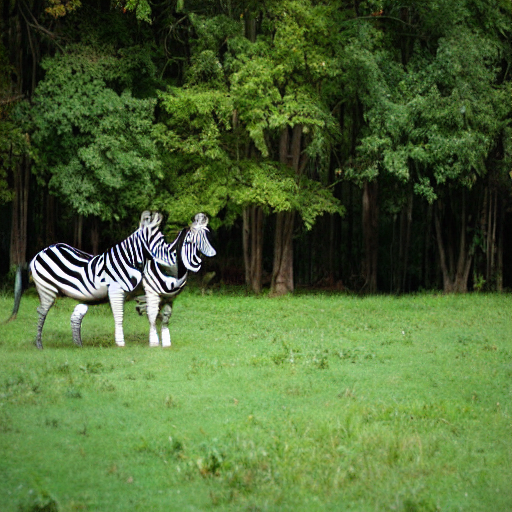

  0%|          | 0/50 [00:00<?, ?it/s]

10


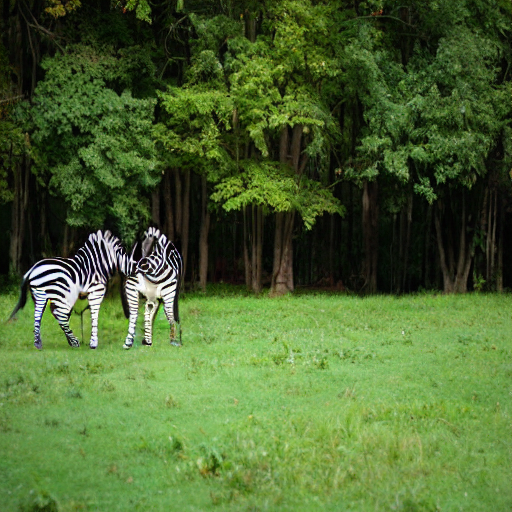

  0%|          | 0/50 [00:00<?, ?it/s]

11


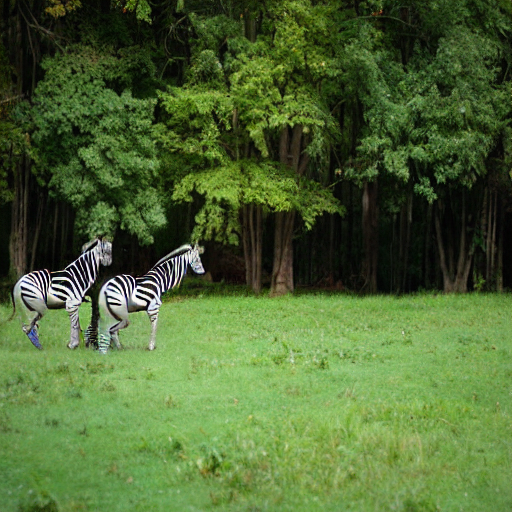

  0%|          | 0/50 [00:00<?, ?it/s]

12


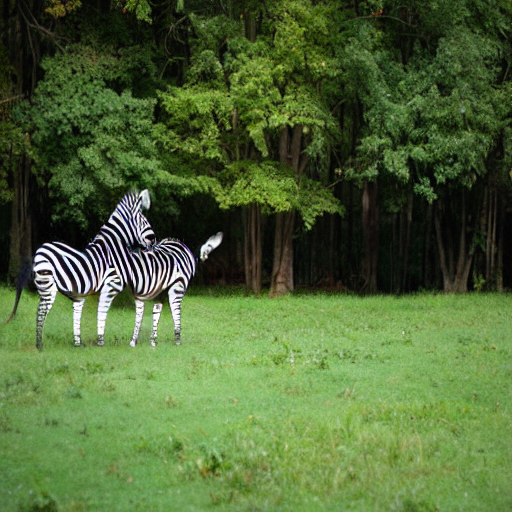

  0%|          | 0/50 [00:00<?, ?it/s]

13


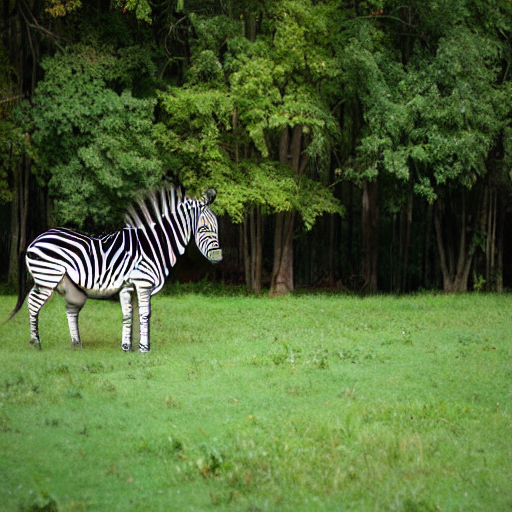

  0%|          | 0/50 [00:00<?, ?it/s]

14


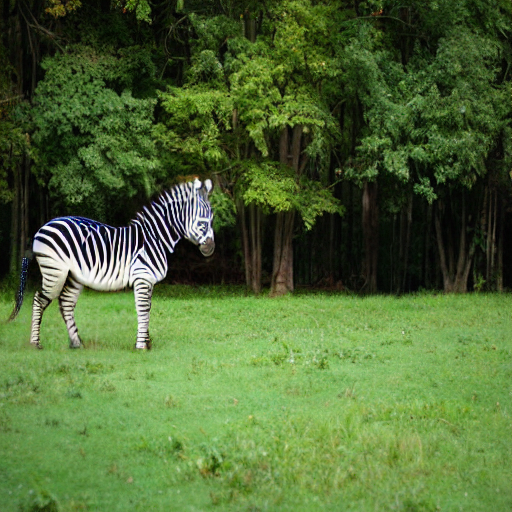

  0%|          | 0/50 [00:00<?, ?it/s]

15


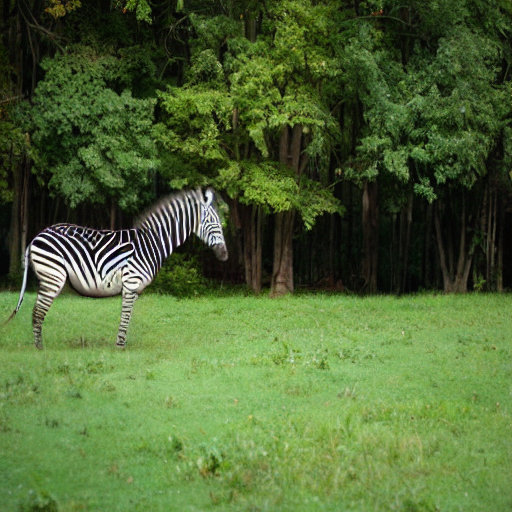

  0%|          | 0/50 [00:00<?, ?it/s]

16


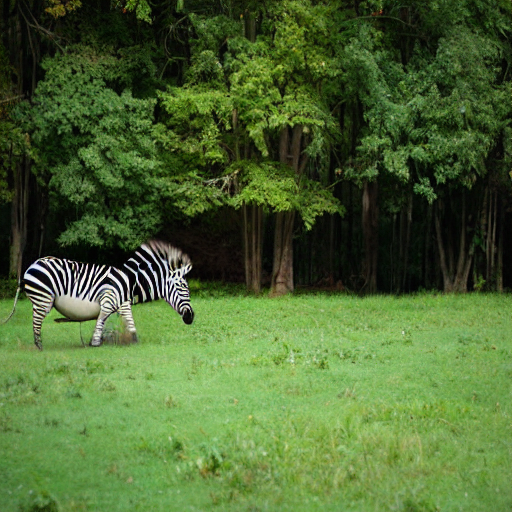

  0%|          | 0/50 [00:00<?, ?it/s]

17


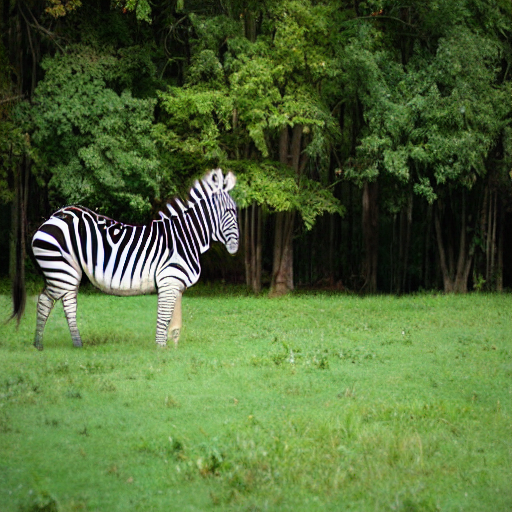

  0%|          | 0/50 [00:00<?, ?it/s]

18


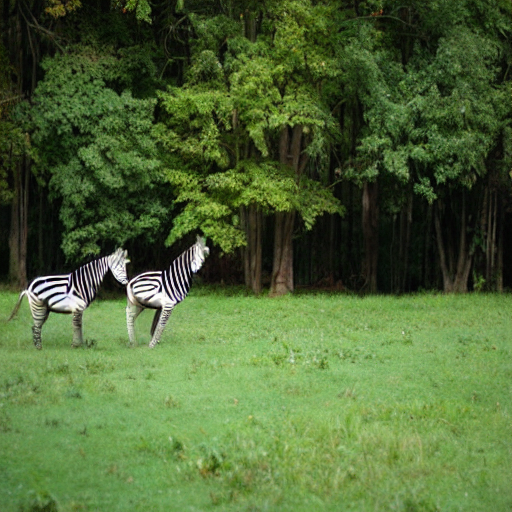

  0%|          | 0/50 [00:00<?, ?it/s]

19


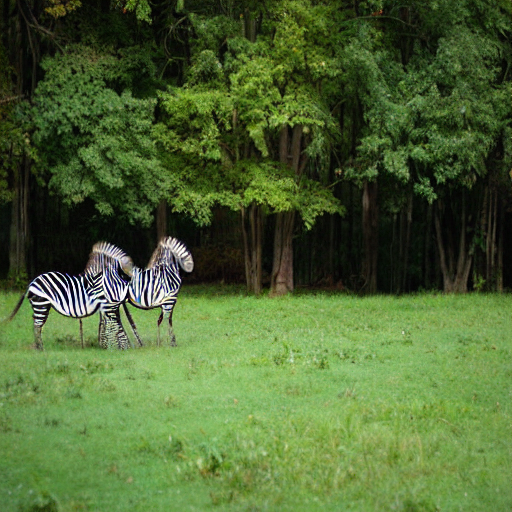

In [39]:
for i in range(0,20):
    generator = torch.cuda.manual_seed(i)
#     final_pil, _= img2noise(init_image, prompt=query_text, mask=torch.from_numpy((final_mask)).cuda(), generator=generator, strength=0.5)
    final_pil = pipe(prompt=query_text, image=init_image, mask_image=Image.fromarray(255*horse_sized_mask.numpy()), num_images_per_prompt=1).images
    print(i)
    display(final_pil[0])

Overall, it seems that the process is doing what we would expect. I am seeing some decent results, but there is definitely still room for innovation in this space. If you noticed any typos or have any ideas for improving this blog post, please reach out to kevin@problemsolversguild.com and let me know! Thank you for reading and I hope this has been helpful in your learning process.